In [51]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

from google.colab.patches import cv2_imshow

In [52]:
REPO_DIR = "/content/ColabProjects"

if not os.path.exists(REPO_DIR):
    !git clone -q https://github.com/VielF/ColabProjects.git

DATASET = "/content/ColabProjects/dataset/ImgTrabM1"

print("Dataset carregado em:")
print(DATASET)

Dataset carregado em:
/content/ColabProjects/dataset/ImgTrabM1


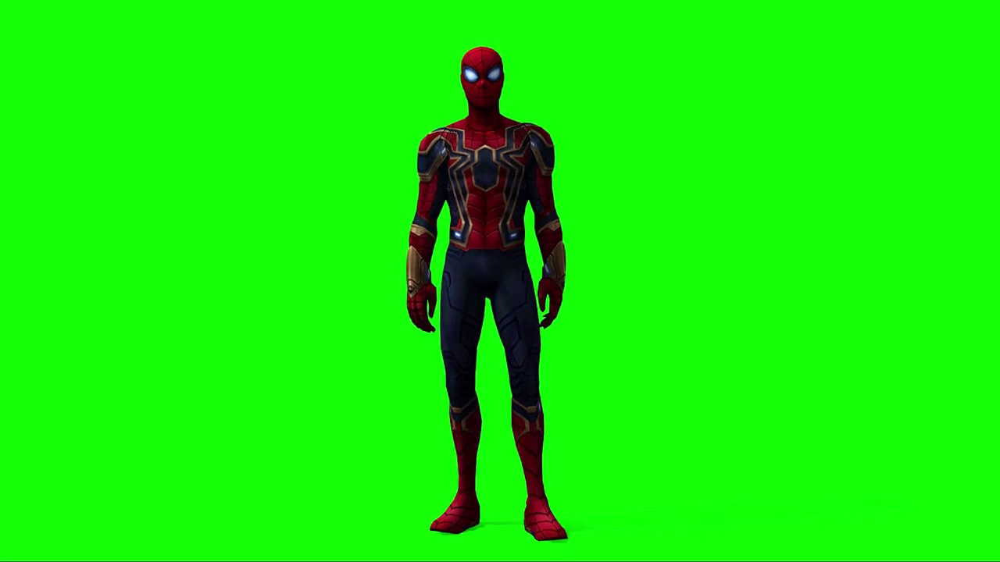

Cor mais frequente: (21, 255, 8)


In [53]:
# 1. Manipulação de Pixels

## a) Cor com maior frequência na imagem
def mostFrequentColor(im):
    frequencias = {}

    altura, largura, canais = im.shape

    cor_mais_frequente = None
    maior_frequencia = 0

    for y in range(altura):
        for x in range(largura):
            cor = (int(im[y, x, 0]), int(im[y, x, 1]), int(im[y, x, 2]))

            if cor in frequencias:
                frequencias[cor] += 1
            else:
                frequencias[cor] = 1

            if frequencias[cor] > maior_frequencia:
                maior_frequencia = frequencias[cor]
                cor_mais_frequente = cor

    return cor_mais_frequente

imagem = cv2.imread(DATASET + "/fg.jpg")

cor = mostFrequentColor(imagem)

# mostra imagem
cv2_imshow(imagem)

cor_rgb = (cor[2], cor[1], cor[0])

print("Cor mais frequente:", cor_rgb)

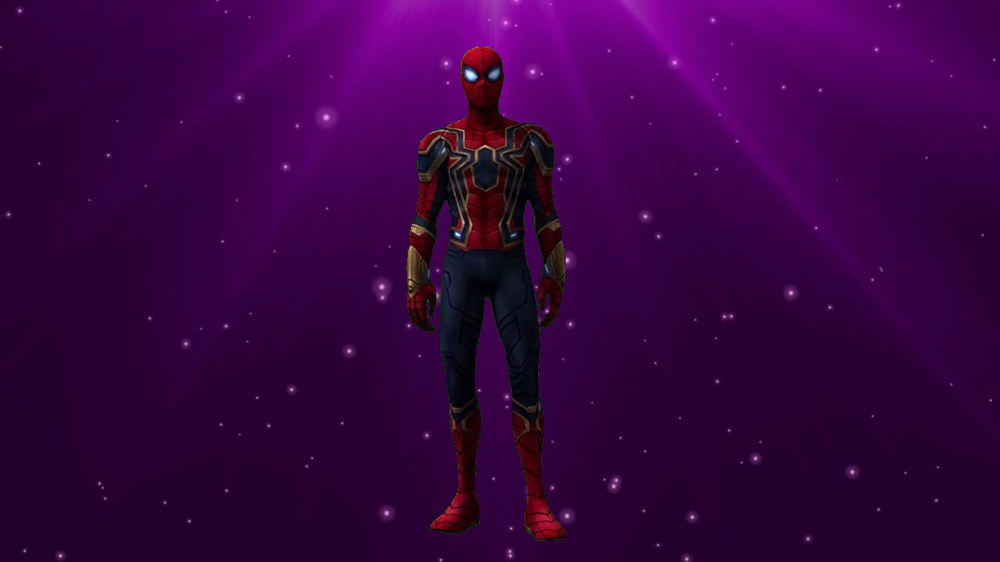

In [54]:
## b) Extraia o objeto em primeiro plano e o insira no plano de fundo
def mergeImage(fg, bg):
    resultado = bg.copy()

    altura, largura, canais = fg.shape

    for y in range(altura):
        for x in range(largura):
            b = int(fg[y, x, 0])
            g = int(fg[y, x, 1])
            r = int(fg[y, x, 2])

            # considera fundo os pixels em que o verde é predominante
            fundo_verde = g > 100 and g > r + 50 and g > b + 50

            if not fundo_verde:
                resultado[y, x] = fg[y, x]

    return resultado

fg = cv2.imread(DATASET + "/fg.jpg")
bg = cv2.imread(DATASET + "/bg.jpg")

resultado = mergeImage(fg, bg)

cv2_imshow(resultado)

Imagem de primeiro plano:


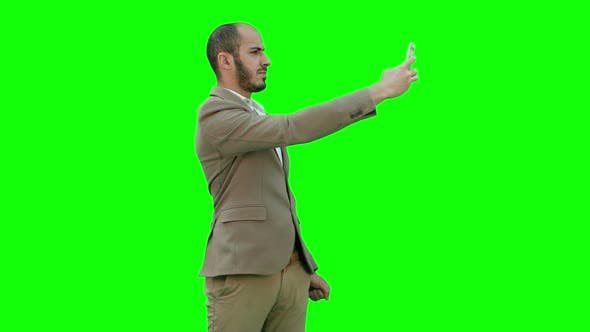

Imagem de plano de fundo:


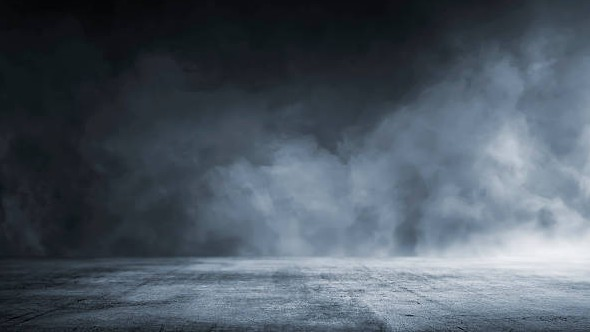

Resultado:


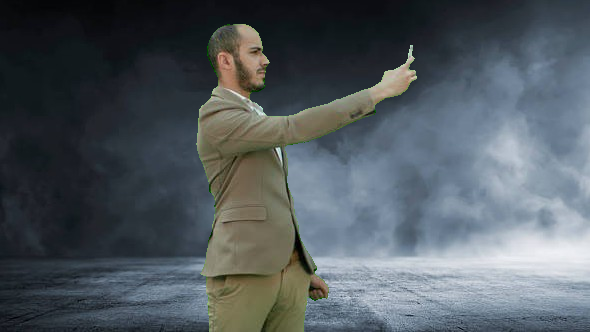

In [55]:
## c) Teste com diferentes imagens de primeiro plano e plano de fundo
fg1 = cv2.imread(DATASET + "/fg1.jpg")
bg1 = cv2.imread(DATASET + "/bg1.jpg")

resultado1 = mergeImage(fg1, bg1)

print("Imagem de primeiro plano:")
cv2_imshow(fg1)

print("Imagem de plano de fundo:")
cv2_imshow(bg1)

print("Resultado:")
cv2_imshow(resultado1)

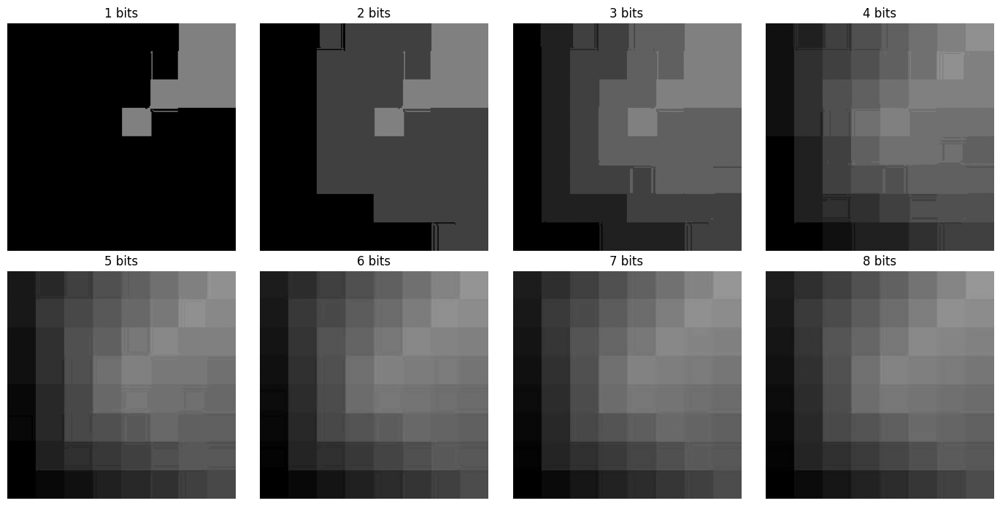

In [56]:
# 2. Manipulação de Bits

## a) Quantização de uma imagem de 8 bits para k bits
def BitQuantizeImage(im, k):
    deslocamento = 8 - k
    return (im >> deslocamento) << deslocamento


im = cv2.imread(DATASET + "/quantize.jpg", cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(14, 7))

for k in range(1, 9):
    quantizada = BitQuantizeImage(im, k)

    plt.subplot(2, 4, k)
    plt.imshow(quantizada, cmap="gray", vmin=0, vmax=255)
    plt.title(f"{k} bits")
    plt.axis("off")

plt.tight_layout()
plt.show()

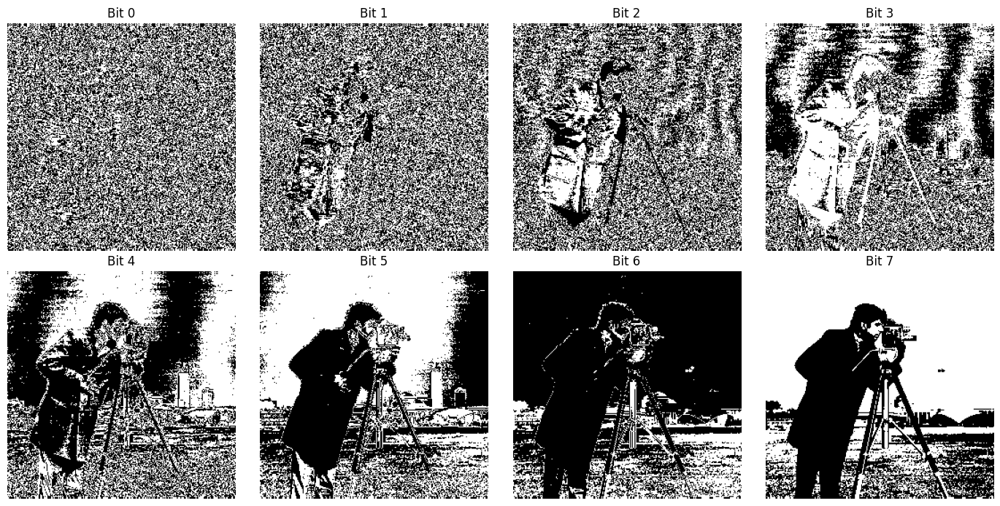

In [57]:
## b) Exibir os diferentes planos de bits da imagem cameraman.png
im = cv2.imread(DATASET + "/cameraman.png", cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(14, 7))

for bit in range(8):
    # extrai o bit desejado e transforma 0/1 em preto/branco
    plano = ((im >> bit) & 1) * 255

    plt.subplot(2, 4, bit + 1)
    plt.imshow(plano, cmap="gray", vmin=0, vmax=255)
    plt.title(f"Bit {bit}")
    plt.axis("off")

plt.tight_layout()
plt.show()

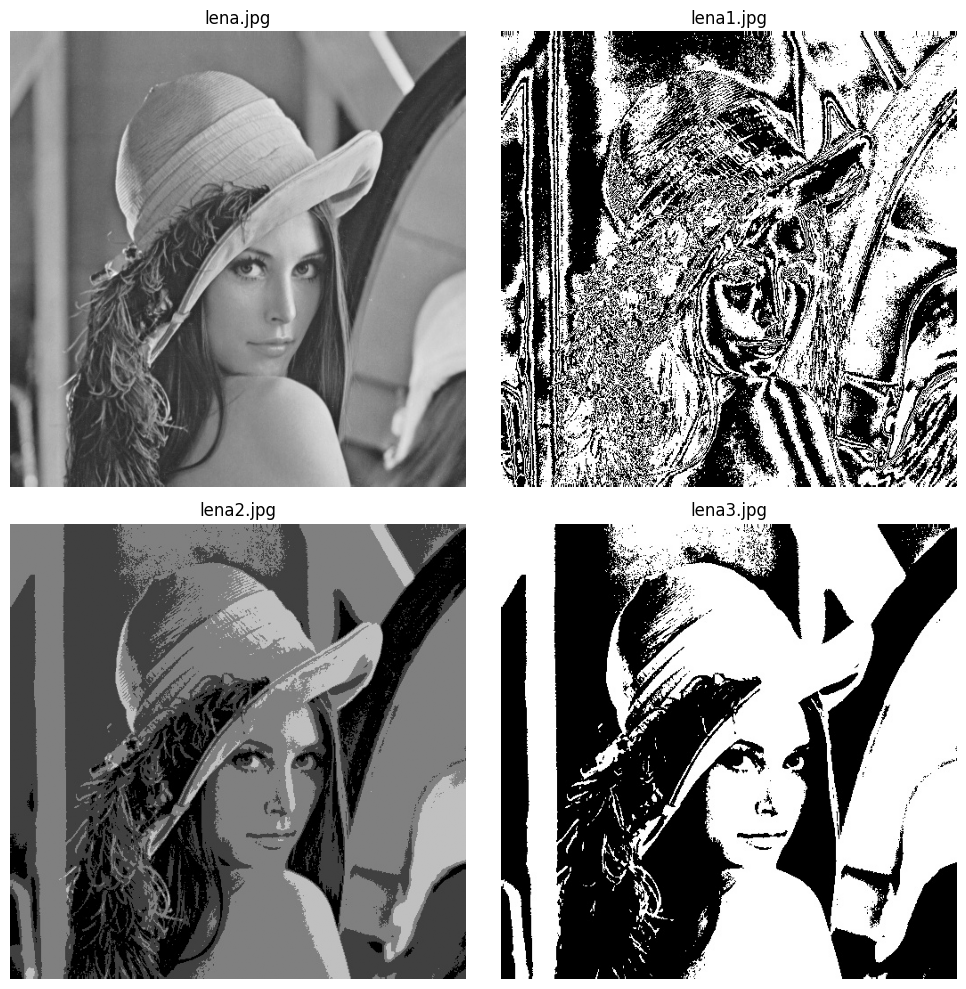

In [58]:
## c) Identificar as operações aplicadas às imagens lena1, lena2 e lena3

# imagens das 4 lenas
lena = cv2.imread(DATASET + "/lena.jpg", cv2.IMREAD_GRAYSCALE)
lena1 = cv2.imread(DATASET + "/lena1.jpg", cv2.IMREAD_GRAYSCALE)
lena2 = cv2.imread(DATASET + "/lena2.jpg", cv2.IMREAD_GRAYSCALE)
lena3 = cv2.imread(DATASET + "/lena3.jpg", cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(10, 10))

imagens = [lena, lena1, lena2, lena3]
titulos = ["lena.jpg", "lena1.jpg", "lena2.jpg", "lena3.jpg"]

for i in range(4):
    plt.subplot(2, 2, i + 1)
    plt.imshow(imagens[i], cmap="gray", vmin=0, vmax=255)
    plt.title(titulos[i])
    plt.axis("off")

plt.tight_layout()
plt.show()

# 3. Questões Diversas

## a) O que se pode afirmar sobre o histograma de uma imagem resultante quando mantemos em 0 os bits MSB no plano de bits?

Quando os bits mais significativos (MSB) são zerados, a imagem perde os níveis de intensidade mais altos e o histograma passa a se concentrar mais nos valores baixos e a imagem fica mais escura. Por exemplo, ao zerar o bit mais significativo de uma imagem de 8 bits, os valores deixam de variar de 0 a 255 e passam a ficar entre 0 e 127.

## b) O que se pode afirmar sobre o histograma de uma imagem resultante quando mantemos em 0 os bits LSB no plano de bits?

Quando os bits menos significativos (LSB) são zerados, a imagem passa a ter menos níveis de intensidade e o histograma fica mais “espaçado”, pois alguns valores deixam de aparecer. Mesmo assim, a aparência geral da imagem muda pouco, já que os bits mais significativos continuam preservando a maior parte das informações de intensidade.

## c) A transmissão é geralmente realizada por meio de pacotes que contêm um bit de início, um byte de informação e um bit de parada. A taxa de transmissão (baud rate) é uma medida comum para a transmissão de dados digitais e é definida como o número de bits transmitidos por segundo. Quanto tempo seria necessário para transmitir uma imagem em tons de cinza de 512 × 512 pixels, com intensidades de 0 a 255, por meio de um enlace de 56K baud? Da mesma forma, calcule o tempo necessário para transmitir a mesma imagem por meio de um enlace de 3000K baud.  A imagem possui:

512 × 512 = 262.144 pixels

Cada pixel possui 8 bits de informação. Como cada byte transmitido contém também 1 bit de início e 1 bit de parada, são transmitidos 10 bits por pixel.

262.144 × 10 = 2.621.440 bits

para 56K baud: 2.621.440 / 56.000 ≈ 46,81 segundos

para 3000K baud: 2.621.440 / 3.000.000 ≈ 0,87 segundo

56K baud: ≈ 46,81 segundos

3000K baud: ≈ 0,87 segundo



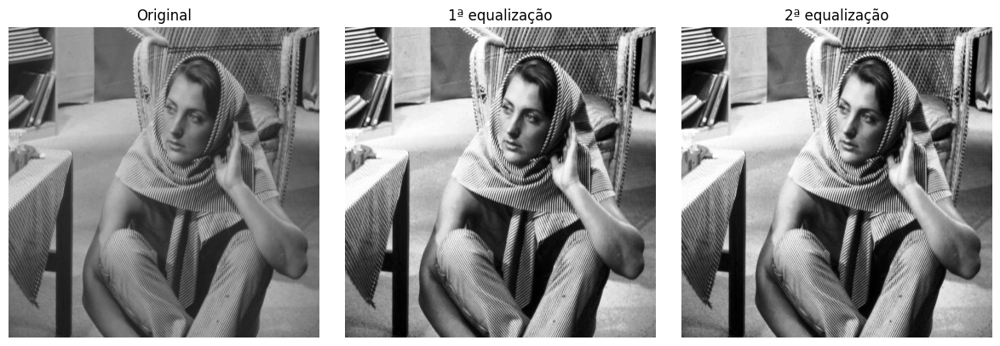

In [59]:
# 4. Transformação de Histograma

## a) Equalização do histograma aplicada duas vezes
def equalizarHistograma(im):
    histograma = np.zeros(256, dtype=int)

    # conta quantas vezes cada intensidade aparece
    for pixel in im.flatten():
        histograma[pixel] += 1

    acumulado = np.zeros(256, dtype=int)
    acumulado[0] = histograma[0]

    for i in range(1, 256):
        acumulado[i] = acumulado[i - 1] + histograma[i]

    total_pixels = im.size

    # cria o novo valor de intensidade para cada nível
    mapa = np.zeros(256, dtype=np.uint8)

    for i in range(256):
        mapa[i] = round((acumulado[i] / total_pixels) * 255)

    resultado = mapa[im]

    return resultado

im = cv2.imread(DATASET + "/barbara.jpg", cv2.IMREAD_GRAYSCALE)

eq1 = equalizarHistograma(im)
eq2 = equalizarHistograma(eq1)

plt.figure(figsize=(12, 4))

imagens = [im, eq1, eq2]
titulos = ["Original", "1ª equalização", "2ª equalização"]

for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(imagens[i], cmap="gray", vmin=0, vmax=255)
    plt.title(titulos[i])
    plt.axis("off")

plt.tight_layout()
plt.show()

### Observação

Na primeira equalização houve um aumento no contraste da imagem, deixando os níveis de cinza mais distribuídos. Ao equalizar novamente, o resultado ficou praticamente igual ao da primeira equalização, pois o histograma já havia sido redistribuído.

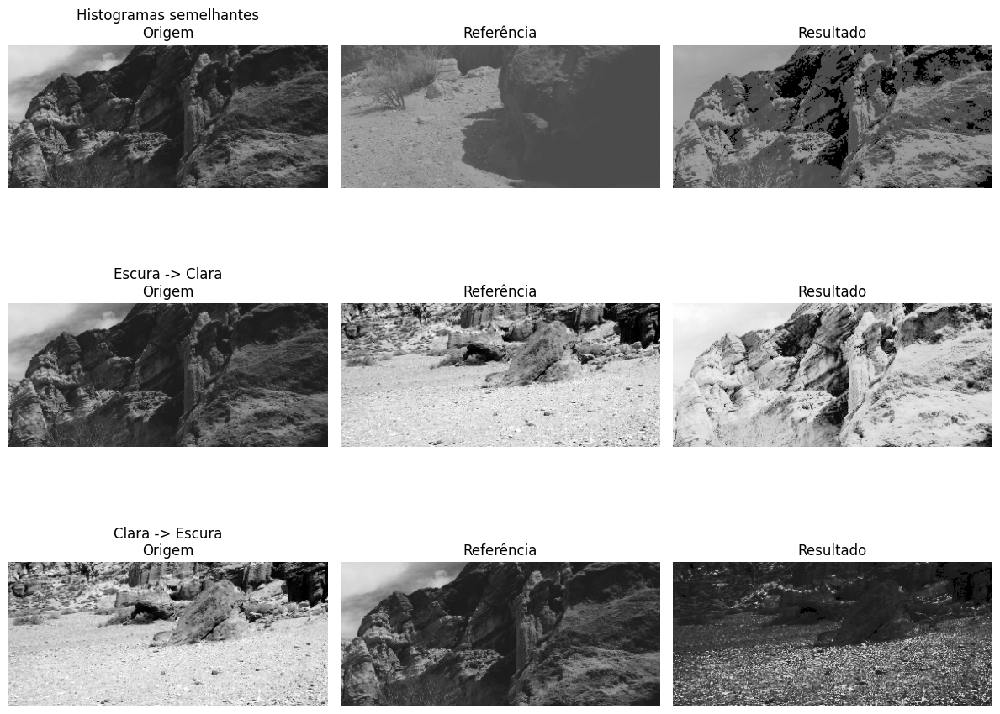

In [60]:
## b) Transformação de histograma entre diferentes imagens
def histogramaAcumulado(im):
    histograma = np.zeros(256)

    for pixel in im.flatten():
        histograma[pixel] += 1

    acumulado = np.zeros(256)
    acumulado[0] = histograma[0]

    for i in range(1, 256):
        acumulado[i] = acumulado[i - 1] + histograma[i]

    return acumulado / im.size

def transformarHistograma(origem, referencia):
    acumulado_origem = histogramaAcumulado(origem)
    acumulado_referencia = histogramaAcumulado(referencia)

    mapa = np.zeros(256, dtype=np.uint8)

    for i in range(256):
        menor_diferenca = float("inf")

        for j in range(256):
            diferenca = abs(acumulado_origem[i] - acumulado_referencia[j])

            if diferenca < menor_diferenca:
                menor_diferenca = diferenca
                mapa[i] = j

    return mapa[origem]

part1 = cv2.imread(DATASET + "/part1.png", cv2.IMREAD_GRAYSCALE)
part2 = cv2.imread(DATASET + "/part2.png", cv2.IMREAD_GRAYSCALE)
part3 = cv2.imread(DATASET + "/part3.png", cv2.IMREAD_GRAYSCALE)
part4 = cv2.imread(DATASET + "/part4.png", cv2.IMREAD_GRAYSCALE)

# histogramas semelhantes
resultado_similar = transformarHistograma(part2, part4)

# escura -> clara
resultado_escura_clara = transformarHistograma(part2, part3)

# clara -> escura
resultado_clara_escura = transformarHistograma(part3, part2)

casos = [
    ("Histogramas semelhantes", part2, part4, resultado_similar),
    ("Escura -> Clara", part2, part3, resultado_escura_clara),
    ("Clara -> Escura", part3, part2, resultado_clara_escura)
]

plt.figure(figsize=(12, 10))

for i, (titulo, origem, referencia, resultado) in enumerate(casos):
    plt.subplot(3, 3, i * 3 + 1)
    plt.imshow(origem, cmap="gray", vmin=0, vmax=255)
    plt.title(titulo + "\nOrigem")
    plt.axis("off")

    plt.subplot(3, 3, i * 3 + 2)
    plt.imshow(referencia, cmap="gray", vmin=0, vmax=255)
    plt.title("Referência")
    plt.axis("off")

    plt.subplot(3, 3, i * 3 + 3)
    plt.imshow(resultado, cmap="gray", vmin=0, vmax=255)
    plt.title("Resultado")
    plt.axis("off")

plt.tight_layout()
plt.show()

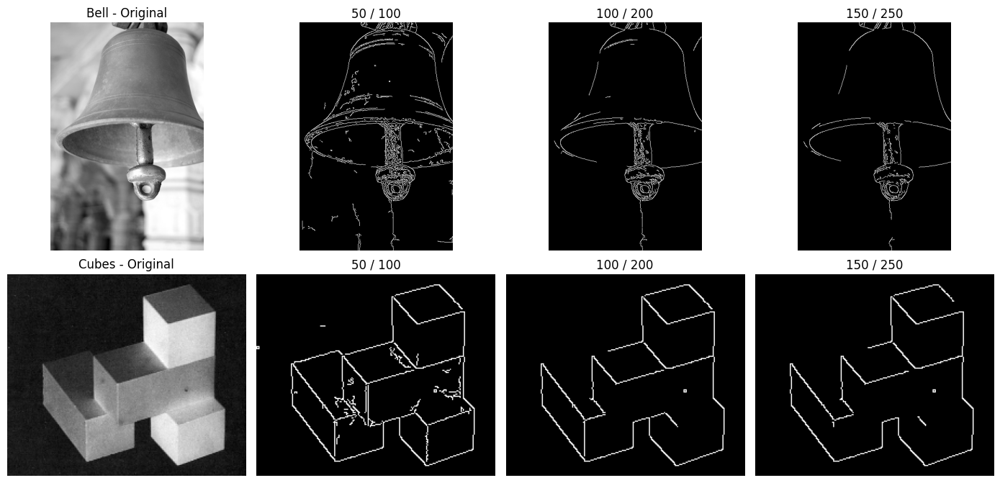

In [61]:
# 5. Detecção de Bordas

## a) Detecção de bordas com Canny
bell = cv2.imread(DATASET + "/bell.jpg", cv2.IMREAD_GRAYSCALE)
cubes = cv2.imread(DATASET + "/cubes.png", cv2.IMREAD_GRAYSCALE)

valores = [
    (50, 100),
    (100, 200),
    (150, 250)
]

plt.figure(figsize=(14, 7))

plt.subplot(2, 4, 1)
plt.imshow(bell, cmap="gray")
plt.title("Bell - Original")
plt.axis("off")

for i, (minVal, maxVal) in enumerate(valores):
    bordas = cv2.Canny(bell, minVal, maxVal)

    plt.subplot(2, 4, i + 2)
    plt.imshow(bordas, cmap="gray")
    plt.title(f"{minVal} / {maxVal}")
    plt.axis("off")

plt.subplot(2, 4, 5)
plt.imshow(cubes, cmap="gray")
plt.title("Cubes - Original")
plt.axis("off")

for i, (minVal, maxVal) in enumerate(valores):
    bordas = cv2.Canny(cubes, minVal, maxVal)

    plt.subplot(2, 4, i + 6)
    plt.imshow(bordas, cmap="gray")
    plt.title(f"{minVal} / {maxVal}")
    plt.axis("off")

plt.tight_layout()
plt.show()

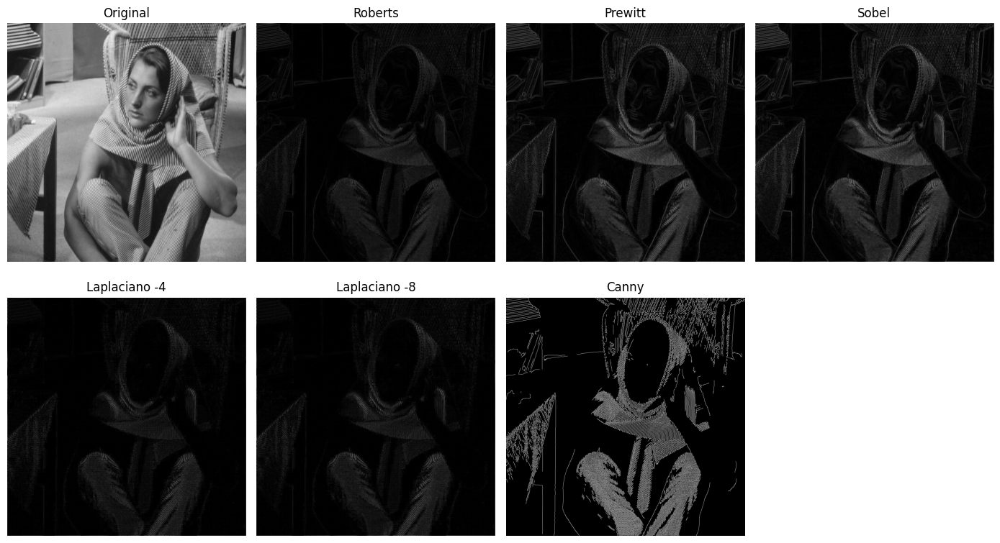

In [62]:
##  b) Filtros Roberts, Prewitt, Sobel e Laplacianos
barbara = cv2.imread(DATASET + "/barbara.jpg", cv2.IMREAD_GRAYSCALE)

# define filtros
roberts_x = np.array([[0, 1],
                      [-1, 0]])

roberts_y = np.array([[1, 0],
                      [0, -1]])

prewitt_x = np.array([[-1, 0, 1],
                      [-1, 0, 1],
                      [-1, 0, 1]])

prewitt_y = np.array([[1, 1, 1],
                      [0, 0, 0],
                      [-1, -1, -1]])

sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])

sobel_y = np.array([[1, 2, 1],
                    [0, 0, 0],
                    [-1, -2, -1]])

laplaciano1 = np.array([[0, 1, 0],
                        [1, -4, 1],
                        [0, 1, 0]])

laplaciano2 = np.array([[1, 1, 1],
                        [1, -8, 1],
                        [1, 1, 1]])

roberts = bordasGradiente(barbara, roberts_x, roberts_y)
prewitt = bordasGradiente(barbara, prewitt_x, prewitt_y)
sobel = bordasGradiente(barbara, sobel_x, sobel_y)

laplace1 = np.abs(convolucao(barbara, laplaciano1))
laplace2 = np.abs(convolucao(barbara, laplaciano2))

canny = cv2.Canny(barbara, 100, 200)

imagens = [barbara, roberts, prewitt, sobel, laplace1, laplace2, canny]
titulos = ["Original", "Roberts", "Prewitt", "Sobel",
           "Laplaciano -4", "Laplaciano -8", "Canny"]

plt.figure(figsize=(14, 8))

for i in range(7):
    plt.subplot(2, 4, i + 1)
    plt.imshow(imagens[i], cmap="gray")
    plt.title(titulos[i])
    plt.axis("off")

plt.tight_layout()
plt.show()

### Observação

Os filtros Roberts, Prewitt e Sobel conseguiram destacar bem as bordas da imagem, principalmente o Prewitt e o Sobel, que deixaram os contornos mais visíveis. Os filtros Laplacianos também detectaram as bordas, mas acabaram destacando mais os detalhes e as texturas da imagem. Já o Canny apresentou um resultado mais limpo, com bordas mais finas e bem definidas, eliminando várias marcações mais fracas que aparecem nos outros filtros.

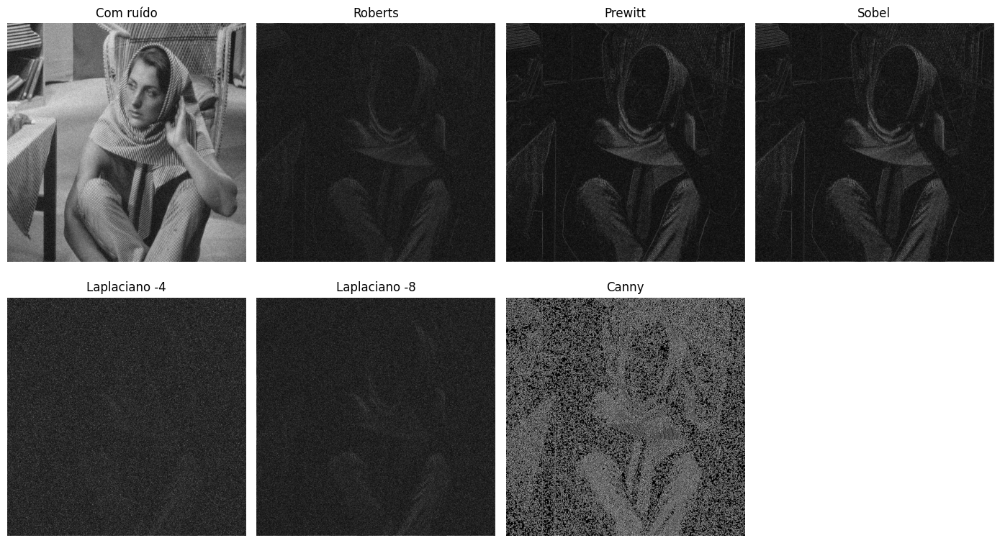

In [63]:
## c) Aplicação dos filtros após adicionar ruído Gaussiano
barbara = cv2.imread(DATASET + "/barbara.jpg", cv2.IMREAD_GRAYSCALE)

ruido = np.random.normal(0, 20, barbara.shape)

barbara_ruido = barbara.astype(float) + ruido
barbara_ruido = np.clip(barbara_ruido, 0, 255).astype(np.uint8)

roberts_ruido = bordasGradiente(barbara_ruido, roberts_x, roberts_y)
prewitt_ruido = bordasGradiente(barbara_ruido, prewitt_x, prewitt_y)
sobel_ruido = bordasGradiente(barbara_ruido, sobel_x, sobel_y)

laplace1_ruido = np.abs(convolucao(barbara_ruido, laplaciano1))
laplace2_ruido = np.abs(convolucao(barbara_ruido, laplaciano2))

canny_ruido = cv2.Canny(barbara_ruido, 100, 200)

imagens = [
    barbara_ruido,
    roberts_ruido,
    prewitt_ruido,
    sobel_ruido,
    laplace1_ruido,
    laplace2_ruido,
    canny_ruido
]

titulos = [
    "Com ruído",
    "Roberts",
    "Prewitt",
    "Sobel",
    "Laplaciano -4",
    "Laplaciano -8",
    "Canny"
]

plt.figure(figsize=(14, 8))

for i in range(7):
    plt.subplot(2, 4, i + 1)
    plt.imshow(imagens[i], cmap="gray")
    plt.title(titulos[i])
    plt.axis("off")

plt.tight_layout()
plt.show()

### Observação

Depois de adicionar o ruído Gaussiano, todos os filtros tiveram mais dificuldade para identificar somente as bordas reais da imagem. O Roberts ficou bastante afetado e o Prewitt e Sobel ainda conseguiram manter melhor os principais contornos, os Laplacianos foram os mais sensíveis ao ruído e o Canny também apresentou várias falsas bordas por causa do ruído.

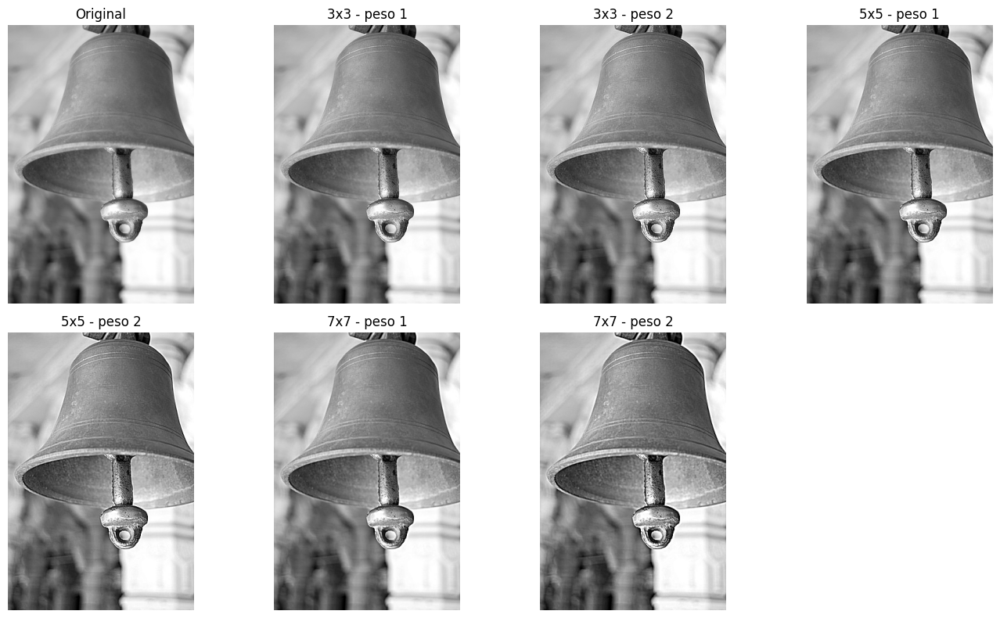

In [64]:
# 6. Filtragem High-Boost

## a) Filtro High-Boost na imagem bell.jpg
def highBoost(im, tamanho, peso):
    altura, largura = im.shape
    margem = tamanho // 2

    imagem_pad = np.pad(im, margem, mode="edge")
    suavizada = np.zeros_like(im, dtype=float)

    # calcula a média da vizinhança
    for y in range(altura):
        for x in range(largura):
            regiao = imagem_pad[y:y + tamanho, x:x + tamanho]
            suavizada[y, x] = np.mean(regiao)

    mascara = im.astype(float) - suavizada
    resultado = im.astype(float) + peso * mascara

    return np.clip(resultado, 0, 255).astype(np.uint8)

bell = cv2.imread(DATASET + "/bell.jpg", cv2.IMREAD_GRAYSCALE)

testes = [
    (3, 1),
    (3, 2),
    (5, 1),
    (5, 2),
    (7, 1),
    (7, 2)
]

plt.figure(figsize=(14, 8))

plt.subplot(2, 4, 1)
plt.imshow(bell, cmap="gray", vmin=0, vmax=255)
plt.title("Original")
plt.axis("off")

for i, (tamanho, peso) in enumerate(testes):
    resultado = highBoost(bell, tamanho, peso)

    plt.subplot(2, 4, i + 2)
    plt.imshow(resultado, cmap="gray", vmin=0, vmax=255)
    plt.title(f"{tamanho}x{tamanho} - peso {peso}")
    plt.axis("off")

plt.tight_layout()
plt.show()

### Observação

Quando aumentamos o tamanho da janela, o filtro começa a destacar mais as bordas e os detalhes da imagem. Já aumentando o peso, esse efeito fica ainda mais forte. Nos testes, as configurações menores deixaram o resultado mais suave, enquanto as janelas maiores com peso 2 deixaram a imagem mais nítida, mas também com as bordas mais marcadas.

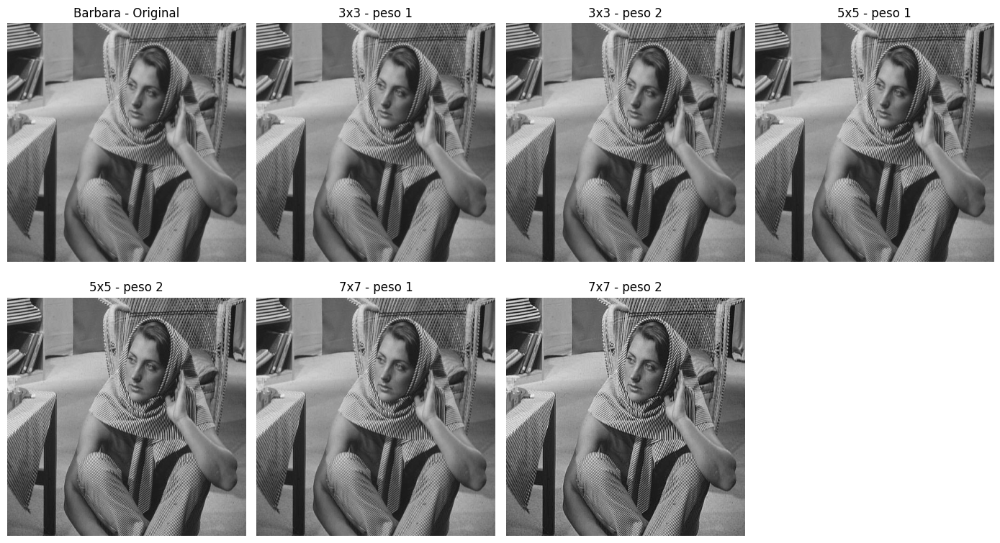

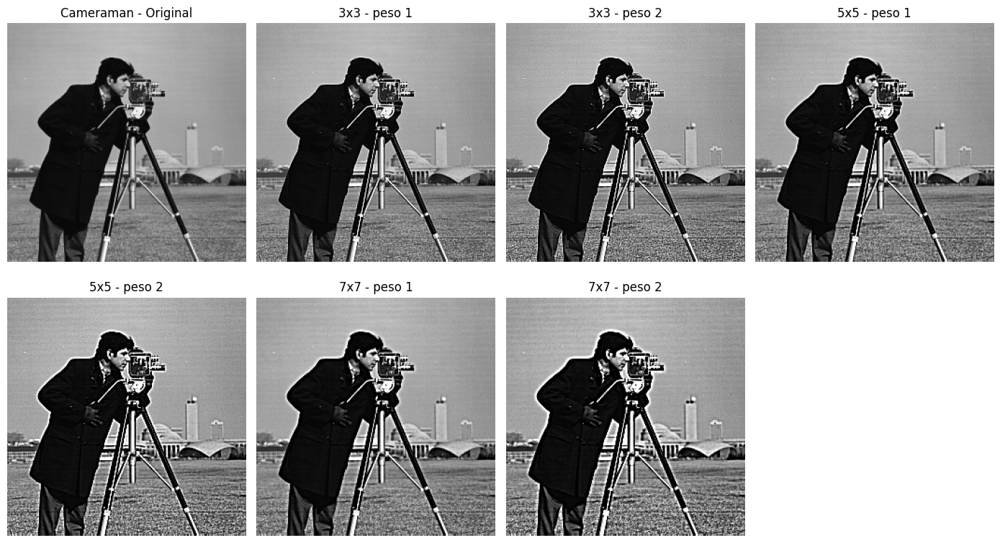

In [65]:
## b) High-Boost aplicado em outras imagens
barbara = cv2.imread(DATASET + "/barbara.jpg", cv2.IMREAD_GRAYSCALE)
cameraman = cv2.imread(DATASET + "/cameraman.png", cv2.IMREAD_GRAYSCALE)

imagens = [
    ("Barbara", barbara),
    ("Cameraman", cameraman)
]

testes = [
    (3, 1),
    (3, 2),
    (5, 1),
    (5, 2),
    (7, 1),
    (7, 2)
]

for nome, im in imagens:
    plt.figure(figsize=(14, 8))

    plt.subplot(2, 4, 1)
    plt.imshow(im, cmap="gray", vmin=0, vmax=255)
    plt.title(nome + " - Original")
    plt.axis("off")

    for i, (tamanho, peso) in enumerate(testes):
        resultado = highBoost(im, tamanho, peso)

        plt.subplot(2, 4, i + 2)
        plt.imshow(resultado, cmap="gray", vmin=0, vmax=255)
        plt.title(f"{tamanho}x{tamanho} - peso {peso}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

## c) Diferença entre o filtro Bilateral e o High-Boost

O filtro High-Boost é usado para aumentar a nitidez da imagem, destacando bordas e detalhes e o filtro Bilateral é usado para suavizar a imagem e reduzir ruídos, mas tentando preservar as bordas.

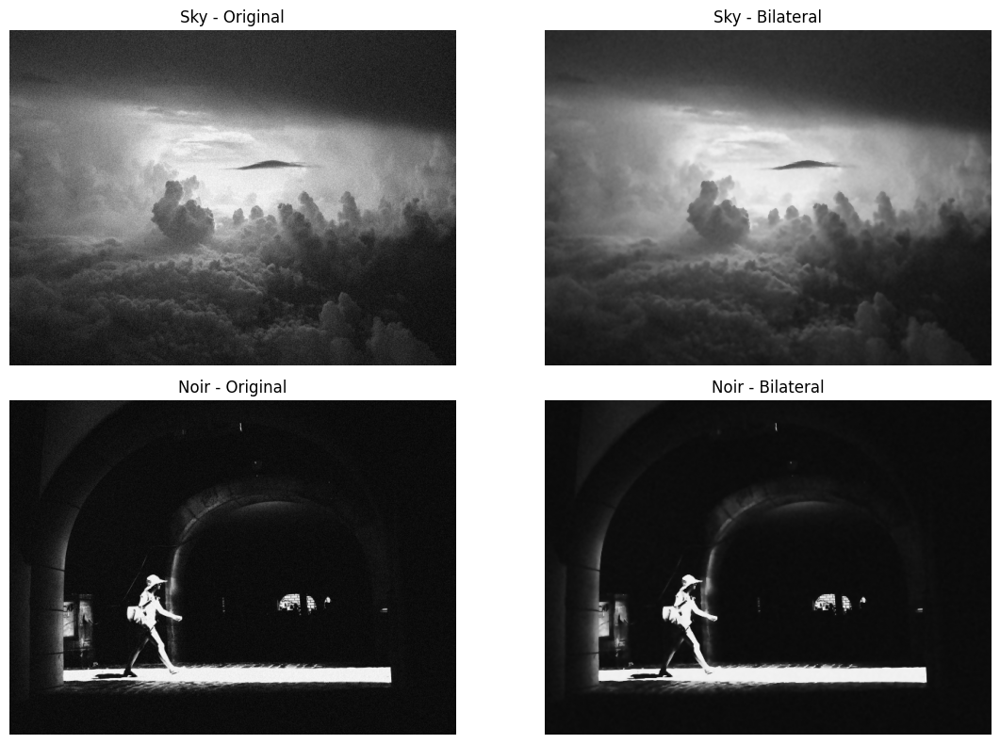

In [66]:
# 7. Filtragem Bilateral

## a) Filtro Bilateral nas imagens sky.png e noir.png
def filtroBilateral(im, tamanho, sigma_espacial, sigma_intensidade):
    altura, largura = im.shape
    margem = tamanho // 2

    imagem_pad = np.pad(im, margem, mode="edge")
    resultado = np.zeros_like(im, dtype=float)

    # peso baseado na distância entre os pixels
    posicoes = np.arange(-margem, margem + 1)
    x, y = np.meshgrid(posicoes, posicoes)

    peso_espacial = np.exp(-(x**2 + y**2) / (2 * sigma_espacial**2))

    for i in range(altura):
        for j in range(largura):
            regiao = imagem_pad[
                i:i + tamanho,
                j:j + tamanho
            ].astype(float)

            centro = float(im[i, j])

            # peso baseado na diferença de intensidade
            peso_intensidade = np.exp(-((regiao - centro)**2) / (2 * sigma_intensidade**2))
            pesos = peso_espacial * peso_intensidade
            resultado[i, j] = np.sum(regiao * pesos) / np.sum(pesos)

    return np.clip(resultado, 0, 255).astype(np.uint8)

sky = cv2.imread(DATASET + "/sky.png", cv2.IMREAD_GRAYSCALE)
noir = cv2.imread(DATASET + "/noir.png", cv2.IMREAD_GRAYSCALE)

sky_filtrada = filtroBilateral(sky, 5, 2, 30)
noir_filtrada = filtroBilateral(noir, 5, 2, 30)

imagens = [sky, sky_filtrada, noir, noir_filtrada]
titulos = ["Sky - Original", "Sky - Bilateral",
           "Noir - Original", "Noir - Bilateral"]

plt.figure(figsize=(12, 8))

for i in range(4):
    plt.subplot(2, 2, i + 1)
    plt.imshow(imagens[i], cmap="gray", vmin=0, vmax=255)
    plt.title(titulos[i])
    plt.axis("off")

plt.tight_layout()
plt.show()

Melhores sigmas: (1, 125)
Distância L2: 7003.780907481329


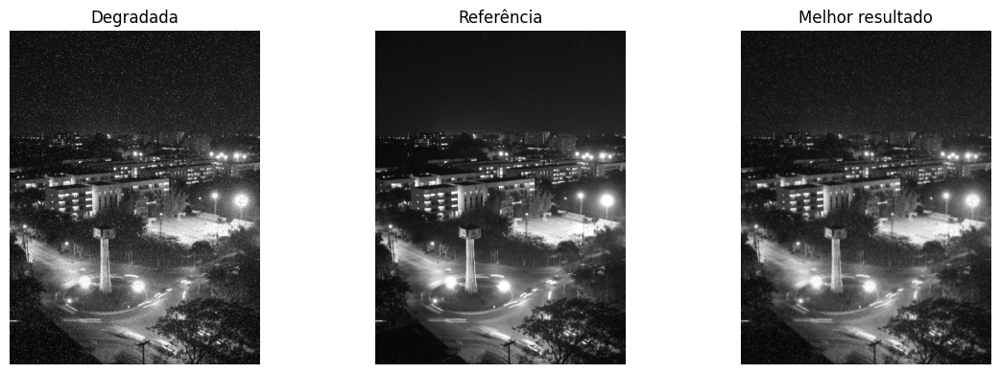

In [67]:
## b) Variação dos sigmas e comparação pela distância L2
degraded = cv2.imread(DATASET + "/Degraded.jpg", cv2.IMREAD_GRAYSCALE)
referencia = cv2.imread(DATASET + "/Clear.jpg", cv2.IMREAD_GRAYSCALE)

sigmas_espaciais = [1, 2, 3]
sigmas_intensidade = [50, 75, 100, 125, 150]

menor_l2 = float("inf")
melhor_resultado = None
melhores_sigmas = (0, 0)

for sigma_e in sigmas_espaciais:
    for sigma_i in sigmas_intensidade:

        resultado = filtroBilateral(degraded, 5, sigma_e, sigma_i)

        l2 = np.linalg.norm(resultado.astype(float) - referencia.astype(float))

        if l2 < menor_l2:
            menor_l2 = l2
            melhor_resultado = resultado
            melhores_sigmas = (sigma_e, sigma_i)

print("Melhores sigmas:", melhores_sigmas)
print("Distância L2:", menor_l2)

imagens = [degraded, referencia, melhor_resultado]
titulos = ["Degradada", "Referência", "Melhor resultado"]

plt.figure(figsize=(12, 4))

for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(imagens[i], cmap="gray", vmin=0, vmax=255)
    plt.title(titulos[i])
    plt.axis("off")

plt.tight_layout()
plt.show()